<h2 align="center">INF575 - Fuzzy Logic</h2>
<h1 align="center">Segmentation of HER2 Overexpression in Histopathology Images with Fuzzy Decision Tree<h1>
    
<center>
    <img src="https://rochepacientes.es/content/dam/roche-pacientes-2/es/assets/images/que-es-her2.jpg" width="60%"/>
</center>

<h2 align="center">Data Exploration</h2>

<center>
<i> Sebastián Bórquez G. - <a href="mailto://sebastian.borquez.g@gmail.com">sebastian.borquez.g@gmail.com</a> - DI UTFSM - August 2020.</i>
</center>


In [3]:
%cd ..

D:\sebas\Desktop\her2_FL


In [110]:
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns; sns.set(palette="muted")
from IPython.display import display, HTML

from load_features import *

In [13]:
features_csv_files = [
    "./data/1+_2.csv",
    "./data/1+_20.csv",
    "./data/2+_1.csv",
    "./data/2+_8.csv",
    "./data/3+_15.csv",
    "./data/3+_16.csv",
]

test_csv_files = [
    "./data/1+_25.csv",
    "./data/2+_9.csv",
    "./data/3+_19.csv",
]

In [113]:
def load_features(csv_filepath, drop_na=True):
    features = pd.read_csv(csv_filepath)
    if drop_na: features = features.dropna()
    return features

def merge_features(list_of_features):
    new_features_df = pd.concat(list_of_features, ignore_index=True)
    return new_features_df

def split_features_target(features):
    target_col = "Class"
    non_features_cols = ["image", "row_i", "col_j", 'B', 'G', 'R']
    features_names = set(features.columns) - set(non_features_cols) - set([target_col])
    features_names = list(features_names)

    X = features[feature_cols].to_numpy()
    y = features[target_col].to_numpy()
    
    return (features_names, target_col), (X, y)
    
def to_images(features, image_name):
    pass

def show_image_and_features(image_name, features_names):
    pass


## Load Features

In [40]:
features_list = [load_features(csv_file) for csv_file in features_csv_files]
features = merge_features(features_list)
del features_list

## Prepare Data

In [114]:
(features_names, target_col), (X, y) = split_features_target(features)

In [115]:
print("Target", target_col)
print("Features:", len(feature_names), end="\n\t")
print(*feature_names, sep="\n\t")

Target Class
Features: 24
	mean_rawblue
	homogeneity_horizontal
	mean_hematoxylin
	mean_horizontal
	energy_horizontal
	mean_exblue
	sobel_magnitud
	mean_rawbred
	mean_exgreen
	laplacian
	mean_saturation
	lpb_ror
	mean_value
	correlation_horizontal
	mean_eosin
	correlation_vertical
	mean_rawgreen
	mean_hue
	mean_vertical
	mean_dab
	energy_vertical
	mean_exred
	homogeneity_vertical
	mean_intentsity


## Explore

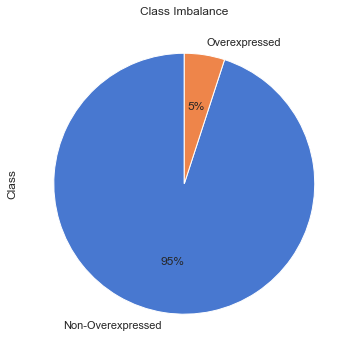

In [102]:
plt.figure(figsize=(6,6))
plt.title("Class Imbalance")
features["Class"]\
    .value_counts(normalize=True)\
    .plot.pie(autopct='%1.0f%%', startangle=90, labels=["Non-Overexpressed", "Overexpressed"]);

In [108]:
show_images = np.random.choice(features.image.unique(), 3)
show_images

array(['3+_19.tif', '3+_16.tif', '2+_9.tif'], dtype=object)

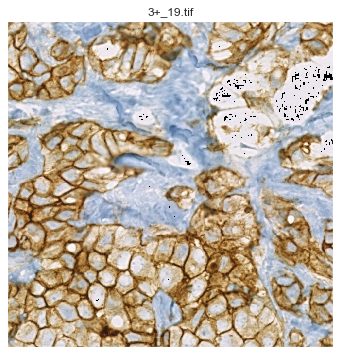

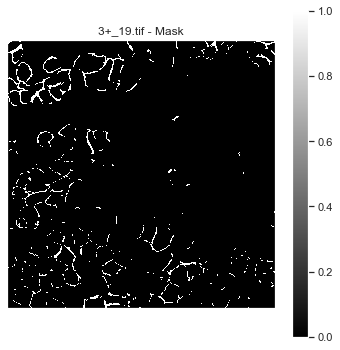

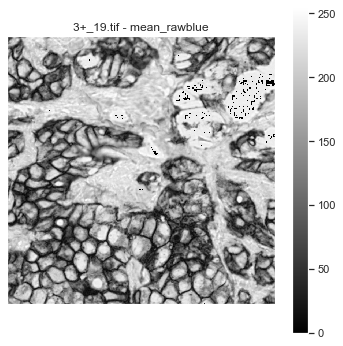

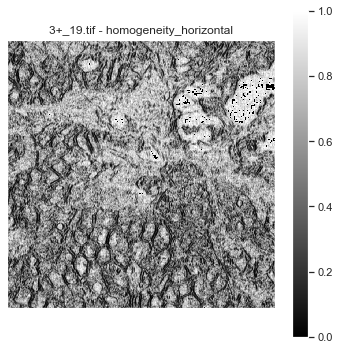

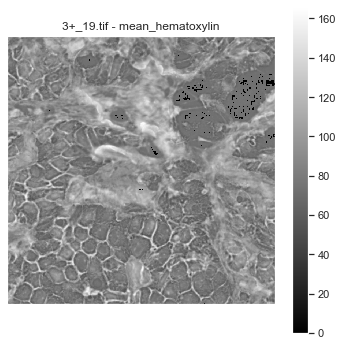

...

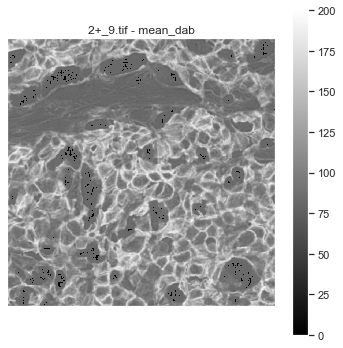

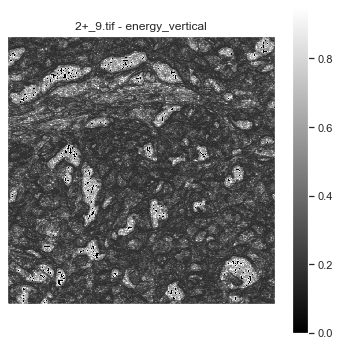

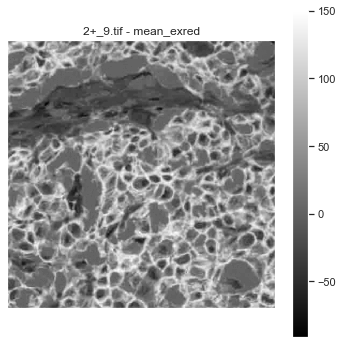

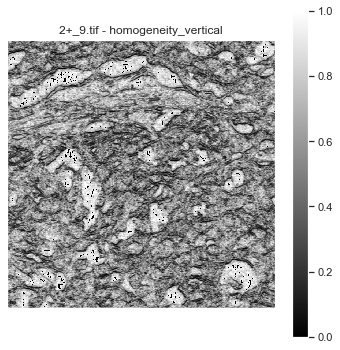

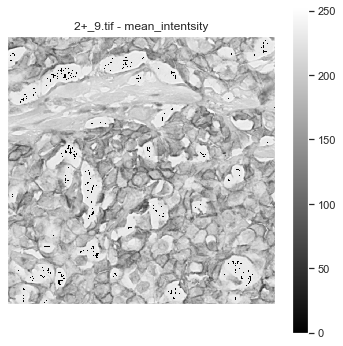

In [156]:
for image_name in show_images:
    display(HTML(f"<center><h3>{image_name}</h3></center>"))
    show_image_and_features(image_name, features, features_names)